In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import MinMaxScaler
from scipy import stats
from sklearn.impute import SimpleImputer
from datetime import datetime
from sklearn.preprocessing import OneHotEncoder

# 1. Exploratory Data Analysis (EDA) (20 points)
This notebook performs EDA, including data inspection, statistical inference, and visualisation for the dataset.


In [2]:
def load_data(file_path):
    """Load the dataset from a CSV file."""
    return pd.read_csv(file_path)

file_path = "dataset.csv"
df = load_data(file_path)

## 1.1 Data Inspection (7 points)
### Inspect the dataset and determine the data types of all features.
### Calculate and analyse basic statistics for each numerical feature.
### Identify features that have missing values.
### Identify the numerical and categorical features to use for further analysis.



In [3]:
def inspect_data(df):
    """Inspect the dataset and determine data types."""
    print("Data types of all features:")
    print(df.dtypes)

    print("\nBasic statistics for numerical features:")
    print(df.describe())

    print("\nFeatures with missing values:")
    print(df.isnull().sum())

    numerical_features = df.select_dtypes(include=[np.number]).columns
    categorical_features = df.select_dtypes(include=['object']).columns

    print("\nNumerical features:", list(numerical_features))
    print("Categorical features:", list(categorical_features))

    return numerical_features, categorical_features

In [4]:
numerical_features, categorical_features = inspect_data(df)

Data types of all features:
Name                              int64
Epoch Date Close Approach       float64
Relative Velocity km per sec     object
Relative Velocity km per hr     float64
Miles per hour                  float64
Miss Dist.(Astronomical)        float64
Miss Dist.(lunar)               float64
Miss Dist.(kilometers)          float64
Miss Dist.(miles)               float64
Jupiter Tisserand Invariant     float64
Epoch Osculation                float64
Semi Major Axis                 float64
Asc Node Longitude              float64
Perihelion Arg                  float64
Aphelion Dist                   float64
Perihelion Time                 float64
Mean Anomaly                    float64
Mean Motion                     float64
approach_year                   float64
approach_month                  float64
approach_day                    float64
Orbital Period                   object
Orbit Uncertainity               object
Hazardous                          bool
dtype: objec

### Use imputation to fill the null values in the dataset.



### Tackling the issue of missing datetime values

In [5]:
def impute_date_features(df):
    """Impute missing values in approach_year, approach_month, approach_day, Epoch Osculation, and Epoch Date Close Approach."""
    date_columns = ['approach_year', 'approach_month', 'approach_day']
    epoch_columns = ['Epoch Osculation', 'Epoch Date Close Approach']

    
    date_imputer = SimpleImputer(strategy='median')
    imputed_date_data = date_imputer.fit_transform(df[date_columns])
    for i, col in enumerate(date_columns):
        df[col] = imputed_date_data[:, i]

    
    df['approach_year'] = df['approach_year'].clip(lower=1900, upper=datetime.now().year + 100)
    df['approach_month'] = df['approach_month'].clip(lower=1, upper=12).astype(int)
    df['approach_day'] = df['approach_day'].clip(lower=1, upper=31).astype(int)

    
    epoch_imputer = SimpleImputer(strategy='mean')
    imputed_epoch_data = epoch_imputer.fit_transform(df[epoch_columns])
    for i, col in enumerate(epoch_columns):
        df[col] = imputed_epoch_data[:, i]

    return df

In [6]:
df = impute_date_features(df)

### Tackling the issue of missing numerical and categorical values

In [7]:
def impute_and_normalize(df, numerical_features, categorical_features):
    """Impute missing values, normalize numerical features, and handle categorical features."""
    
    date_columns = ['approach_year', 'approach_month', 'approach_day', 'Epoch Osculation', 'Epoch Date Close Approach']
    numerical_features = [col for col in numerical_features if col not in date_columns]

    if numerical_features:
        num_imputer = KNNImputer(n_neighbors=5)
        df_num = pd.DataFrame(num_imputer.fit_transform(df[numerical_features]),
                              columns=numerical_features,
                              index=df.index)

        for feature in numerical_features:
            # Box-Cox transformation first
            try:
                df_num[feature], _ = stats.boxcox(df_num[feature] - df_num[feature].min() + 1)
            except:
                # If Box-Cox fails, use Min-Max scaling
                scaler = MinMaxScaler()
                df_num[feature] = scaler.fit_transform(df_num[feature].values.reshape(-1, 1))

        df[numerical_features] = df_num

    for cat_feature in categorical_features:
        
        numeric_ratio = pd.to_numeric(df[cat_feature], errors='coerce').notna().mean()

        if numeric_ratio > 0.5:  
            
            temp_series = pd.to_numeric(df[cat_feature], errors='coerce')

            
            median_value = temp_series.median()
            temp_series = temp_series.fillna(median_value)

            
            n_bins = min(10, len(temp_series.unique()))
            df[cat_feature] = pd.qcut(temp_series, q=n_bins, labels=[f'bin_{i}' for i in range(n_bins)], duplicates='drop')

        else:
            
            mode_value = df[cat_feature].mode()[0]
            df[cat_feature] = df[cat_feature].fillna(mode_value)
            df[cat_feature] = df[cat_feature].astype('category')

    return df

In [8]:
df = impute_and_normalize(df, numerical_features, categorical_features)

## 1.2 Statistical Inference (6 points)
### Plot the distribution of numerical features to assess the skewness.


In [9]:
def plot_distributions(df, numerical_features):
    """Plot distributions of numerical features."""
    date_columns = ['approach_year', 'approach_month', 'approach_day', 'Epoch Osculation', 'Epoch Date Close Approach','Name']
    plot_features = [col for col in numerical_features if col not in date_columns]

    fig, axes = plt.subplots(len(plot_features), 1, figsize=(10, 5*len(plot_features)))
    for i, feature in enumerate(plot_features):
        sns.histplot(df[feature], ax=axes[i])
        axes[i].set_title(f'Distribution of {feature}')
    plt.tight_layout()
    plt.show()

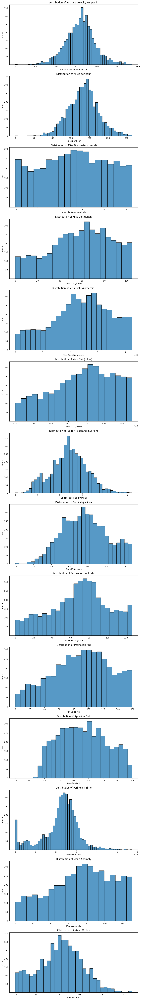

In [10]:
plot_distributions(df, numerical_features)

In [11]:
def identify_outliers(df, numerical_features):
    """Identify potential outliers using box plots."""
    date_columns = ['approach_year', 'approach_month', 'approach_day', 'Epoch Osculation', 'Epoch Date Close Approach','Name']
    plot_features = [col for col in numerical_features if col not in date_columns]

    fig, axes = plt.subplots(len(plot_features), 1, figsize=(10, 5*len(plot_features)))
    for i, feature in enumerate(plot_features):
        sns.boxplot(x=df[feature], ax=axes[i])
        axes[i].set_title(f'Box plot of {feature}')
    plt.tight_layout()
    plt.show()

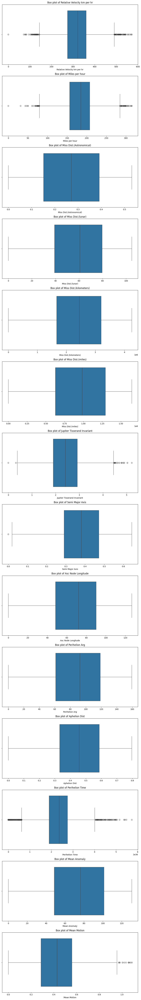

In [12]:
identify_outliers(df, numerical_features)

### Explore the relationship between different features using scatter plots or correlation matrices.


In [13]:
def plot_correlation_matrix(df, numerical_features):
    """Plot correlation matrix for numerical features."""
    corr_matrix = df[numerical_features].corr()
    plt.figure(figsize=(20, 20))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
    plt.title('Correlation Matrix')
    plt.show()

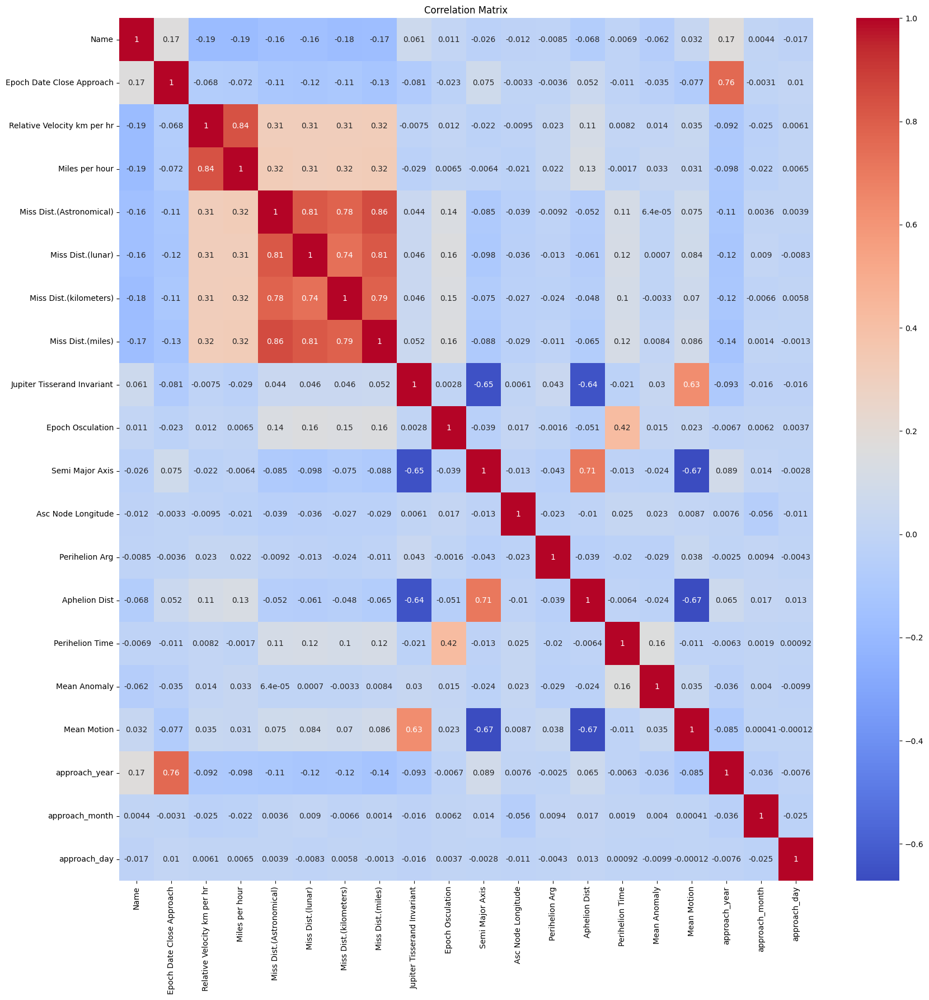

In [14]:
plot_correlation_matrix(df, numerical_features)

## 1.3 Visualisation (4 points)
### Create a pairplot using Seaborn to visualise relationships between multiple numerical features.


Plot of scatter pair diagonal plot on and off- diagonal plot and take out information

In [15]:
date_columns = ['approach_year', 'approach_month', 'approach_day', 'Epoch Osculation', 'Epoch Date Close Approach','Name']
plot_features= [col for col in numerical_features if col not in date_columns]

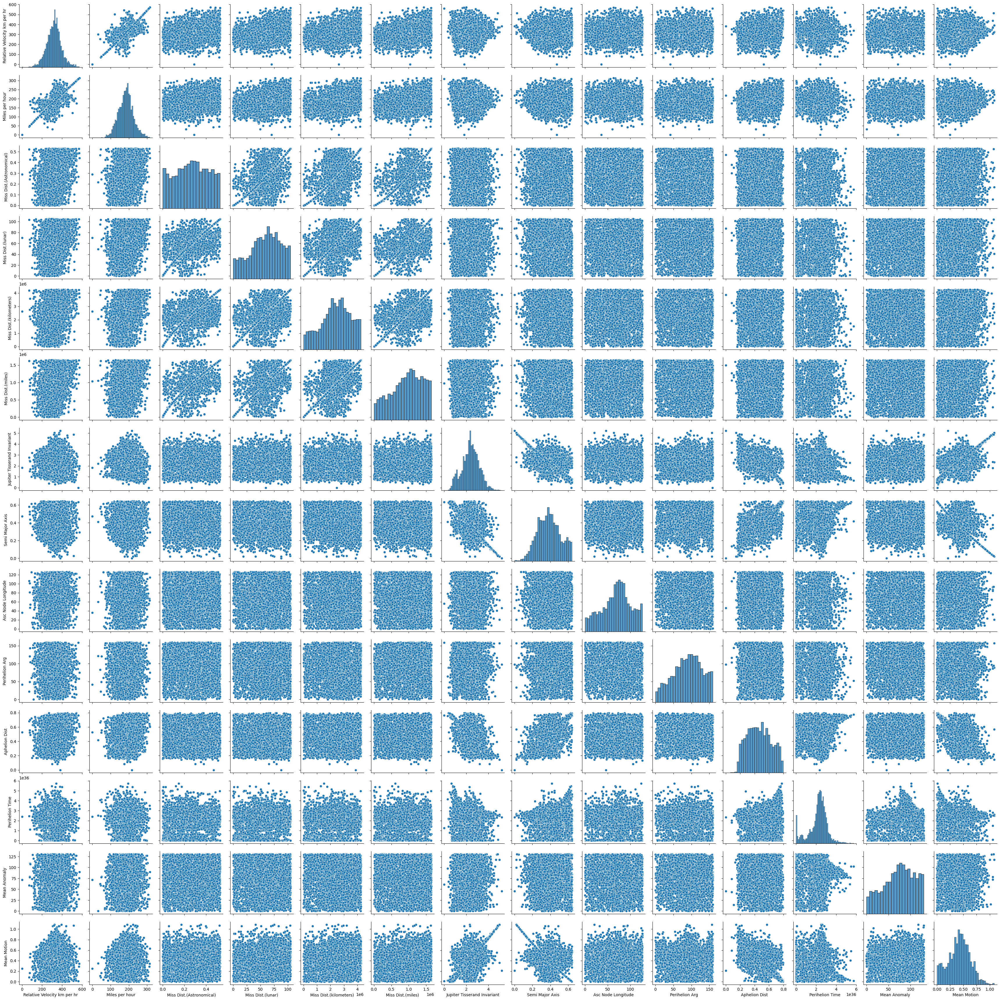

In [16]:
sns.pairplot(df[plot_features])

### Inference from the pairplot.
- Diagonal plots show the distribution of individual features in linear fashion with the increasing slope.
- Off-diagonal plots show the pairwise relationships between features with negative slope for the some features.


## 1.4 Tackling Class Imbalance (3 points)
### Check for class imbalance and discuss its impact on model performance.


In [17]:
def check_class_imbalance(df, target_column):
    """Check for class imbalance in the target variable."""
    class_distribution = df[target_column].value_counts(normalize=True)
    print("Class distribution:")
    print(class_distribution)

    plt.figure(figsize=(8, 6))
    sns.barplot(x=class_distribution.index, y=class_distribution.values)
    plt.title('Class Distribution')
    plt.ylabel('Proportion')
    plt.show()

Class distribution:
Hazardous
False    0.837671
True     0.162329
Name: proportion, dtype: float64


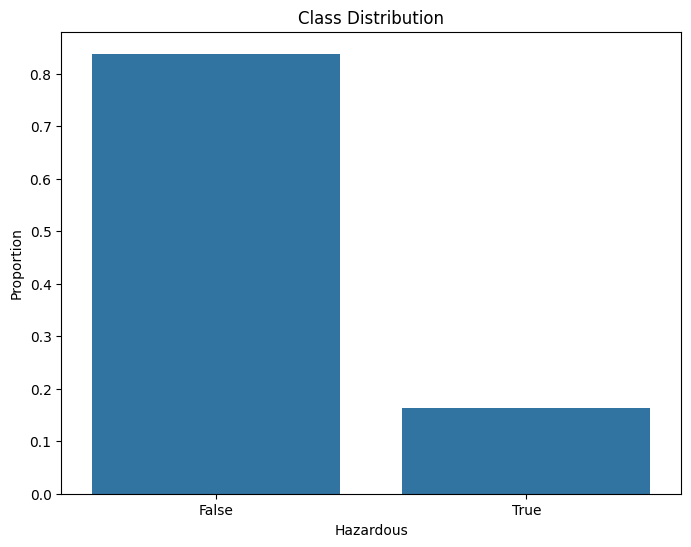

In [18]:
target_column = "Hazardous"
check_class_imbalance(df, target_column)

Class imbalance can result in biased model predictions, favoring the majority class. Techniques like oversampling, undersampling, or using performance metrics like AUC help mitigate this issue.
My team have used ADASYN to handle the class imbalance

**Inspection of numerical and categorical data for the further analysis**

In [19]:
print(numerical_features)

Index(['Name', 'Epoch Date Close Approach', 'Relative Velocity km per hr',
       'Miles per hour', 'Miss Dist.(Astronomical)', 'Miss Dist.(lunar)',
       'Miss Dist.(kilometers)', 'Miss Dist.(miles)',
       'Jupiter Tisserand Invariant', 'Epoch Osculation', 'Semi Major Axis',
       'Asc Node Longitude', 'Perihelion Arg', 'Aphelion Dist',
       'Perihelion Time', 'Mean Anomaly', 'Mean Motion', 'approach_year',
       'approach_month', 'approach_day'],
      dtype='object')


In [20]:
print(categorical_features)
print(df['Relative Velocity km per sec'].unique())
print(df['Orbital Period'].unique())
print(df['Orbital Period'].unique())

Index(['Relative Velocity km per sec', 'Orbital Period', 'Orbit Uncertainity'], dtype='object')
['Very Slow', 'Slow', 'Fast', 'Very Fast']
Categories (4, object): ['Fast', 'Slow', 'Very Fast', 'Very Slow']
['Low', 'Medium', 'High']
Categories (3, object): ['High', 'Low', 'Medium']
['Low', 'Medium', 'High']
Categories (3, object): ['High', 'Low', 'Medium']


# 2. Numerical Interpretation and Mathematical Analysis (20 points)
This section covers feature engineering, additional features, and handling binned values from the dataset.


In [21]:
from datetime import datetime, timedelta
from scipy.constants import G
from sklearn.preprocessing import OrdinalEncoder
from sklearn.impute import SimpleImputer

In [22]:
df.columns

Index(['Name', 'Epoch Date Close Approach', 'Relative Velocity km per sec',
       'Relative Velocity km per hr', 'Miles per hour',
       'Miss Dist.(Astronomical)', 'Miss Dist.(lunar)',
       'Miss Dist.(kilometers)', 'Miss Dist.(miles)',
       'Jupiter Tisserand Invariant', 'Epoch Osculation', 'Semi Major Axis',
       'Asc Node Longitude', 'Perihelion Arg', 'Aphelion Dist',
       'Perihelion Time', 'Mean Anomaly', 'Mean Motion', 'approach_year',
       'approach_month', 'approach_day', 'Orbital Period',
       'Orbit Uncertainity', 'Hazardous'],
      dtype='object')

## 2.1 Feature Engineering (15 points)



### Combine the approach_date, month, and year features into a single feature representing the day of the year and convert it into a 'datetime' format. (1 MARK)


In [23]:
df['approach_date'] = pd.to_datetime({
    'year': df['approach_year'],
    'month': df['approach_month'],
    'day': df['approach_day']
})


df['approach_date'] = df['approach_date'].dt.date


print(df[['approach_year', 'approach_month', 'approach_day', 'approach_date']].head())

   approach_year  approach_month  approach_day approach_date
0         2008.0               1             1    2008-01-01
1         1995.0               1             1    1995-01-01
2         1995.0               7             8    1995-07-08
3         1995.0               7            15    1995-07-15
4         2008.0               7            15    2008-07-15


### Calculate the ratio of Miss Distance vs. Semi-major axis. Create a 'Time Until Approach' feature based on the difference between the 'Epoch Date Close Approach' and the current date. (3 MARKS)
### Calculate the eccentricity of the orbit, average orbital velocity, and orbital period using Kepler’s Law. (3 MARKS)
### Calculate the heliocentric distance, escape velocity, and specific orbital energy. (3 MARKS)
### Calculate the Specific Angular Momentum using the formula: h=sqrt(GMa(1−e²)). (1 MARK)
### Calculate the velocity at Perihelion and Aphelion. (1 MARK)
### Average the Miss Distance of various categories and find the closest approach distance. (1 MARK)
### Calculate Synodic Period and Mean Motion using the orbital period. (2 MARKS)




In [24]:
# Constants
AU_to_meters = 1.496e11  
G = 6.67430e-11  
M_sun = 1.989e30  

In [25]:
df['Epoch Date Close Approach'] = pd.to_datetime(df['Epoch Date Close Approach'], unit='ms')
df['time_until_approach'] = (df['Epoch Date Close Approach'] - datetime.now()).dt.days

In [26]:
velocity_mapping = {
    'Very Slow': 1.0,
    'Slow': 2.0,
    'Fast': 3.0,
    'Very Fast': 4.0
}

orbital_period_mapping = {
    'Low': 1.0,
    'Medium': 2.0,
    'High': 3.0
}

orbit_uncertainty_mapping = {
    'Low': 1.0,
    'Medium': 2.0,
    'High': 3.0
}

# Convert categorical columns to numeric
df['relative_velocity_numeric'] = df['Relative Velocity km per sec'].map(velocity_mapping)
df['orbital_period_numeric'] = df['Orbital Period'].map(orbital_period_mapping)
df['orbit_uncertainty_numeric'] = df['Orbit Uncertainity'].map(orbit_uncertainty_mapping)

In [27]:
# Helper functions for safe calculations
def safe_divide(a, b, fill_value=np.nan):
    return np.where(b != 0, a/b, fill_value)

In [28]:
def safe_sqrt(x, fill_value=np.nan):
    return np.where(x >= 0, np.sqrt(x), fill_value)

In [29]:
def calculate_orbital_parameters(df):
    """Calculate orbital parameters with safety checks"""

    # Miss Distance ratio with safety check
    df['miss_distance_ratio'] = safe_divide(
        df['Miss Dist.(Astronomical)'],
        df['Semi Major Axis']
    )

    # Perihelion Distance with validation
    df['Perihelion Dist'] = np.where(
        df['Semi Major Axis'] >= df['Aphelion Dist'],
        2 * df['Semi Major Axis'] - df['Aphelion Dist'],
        np.nan
    )

    # Eccentricity with physical constraints
    denominator = (df['Aphelion Dist'] + df['Perihelion Dist'])
    eccentricity = safe_divide(
        (df['Aphelion Dist'] - df['Perihelion Dist']),
        denominator
    )
    df['eccentricity'] = np.clip(eccentricity, 0, 1)

    # Semi Major Axis in meters
    df['semi_major_axis_m'] = df['Semi Major Axis'] * AU_to_meters

    # Average orbital velocity
    df['avg_orbital_velocity'] = df['relative_velocity_numeric'].astype(float) * 1000

    # Heliocentric distance
    df['heliocentric_distance'] = np.where(
        df['Semi Major Axis'] > 0,
        df['Semi Major Axis'] * AU_to_meters,
        np.nan
    )

    # Escape velocity with safety checks
    escape_velocity_term = 2 * G * M_sun / df['heliocentric_distance']
    df['escape_velocity'] = safe_sqrt(escape_velocity_term)

    # Specific Orbital Energy with safety check
    df['specific_orbital_energy'] = np.where(
        df['semi_major_axis_m'] > 0,
        -G * M_sun / (2 * df['semi_major_axis_m']),
        np.nan
    )

    # Specific Angular Momentum with safety check
    angular_momentum_term = G * M_sun * df['semi_major_axis_m'] * (1 - df['eccentricity']**2)
    df['specific_angular_momentum'] = safe_sqrt(angular_momentum_term)

    # Velocities at perihelion and aphelion with safety checks
    perihelion_term = np.where(
        (df['eccentricity'] < 1) & (df['semi_major_axis_m'] > 0),
        G * M_sun * ((1 + df['eccentricity']) / (df['semi_major_axis_m'] * (1 - df['eccentricity']))),
        np.nan
    )
    df['velocity_perihelion'] = safe_sqrt(perihelion_term)

    aphelion_term = np.where(
        (df['eccentricity'] < 1) & (df['semi_major_axis_m'] > 0),
        G * M_sun * ((1 - df['eccentricity']) / (df['semi_major_axis_m'] * (1 + df['eccentricity']))),
        np.nan
    )
    df['velocity_aphelion'] = safe_sqrt(aphelion_term)

    # Miss Distance calculations with safety checks
    miss_distance_columns = ['Miss Dist.(Astronomical)', 'Miss Dist.(lunar)',
                           'Miss Dist.(kilometers)', 'Miss Dist.(miles)']
    df['average_miss_distance'] = df[miss_distance_columns].mean(axis=1)
    df['closest_approach_distance'] = df[miss_distance_columns].min(axis=1)

    # Synodic period with safety check
    P_earth = 1.0
    orbital_period = df['orbital_period_numeric'].astype(float)
    denominator = np.abs((1 / orbital_period) - (1 / P_earth))
    df['synodic_period'] = safe_divide(1, denominator)

    # Mean motion with safety check
    seconds_per_year = 3.154e7
    df['orbital_period_seconds'] = orbital_period * seconds_per_year
    df['mean_motion'] = safe_divide(2 * np.pi, df['orbital_period_seconds'])

    return df

In [30]:
df = calculate_orbital_parameters(df)

In [31]:
def clean_and_impute(df):
    """Handle infinite values and impute missing values with proper categorical handling"""

   
    categorical_mappings = {
        'Relative Velocity km per sec': {
            'Very Slow': 1.0,
            'Slow': 2.0,
            'Fast': 3.0,
            'Very Fast': 4.0
        },
        'Orbital Period': {
            'Low': 1.0,
            'Medium': 2.0,
            'High': 3.0
        },
        'Orbit Uncertainity': {
            'Low': 1.0,
            'Medium': 2.0,
            'High': 3.0
        }
    }

    
    for col, mapping in categorical_mappings.items():
        df[col + '_numeric'] = df[col].map(mapping).astype(float)

    # List of derived columns 
    derived_columns = [
        'miss_distance_ratio', 'Perihelion Dist', 'eccentricity', 'semi_major_axis_m',
        'avg_orbital_velocity', 'heliocentric_distance', 'escape_velocity',
        'specific_orbital_energy', 'specific_angular_momentum', 'velocity_perihelion',
        'velocity_aphelion', 'average_miss_distance', 'closest_approach_distance',
        'synodic_period', 'relative_velocity_numeric', 'orbital_period_numeric',
        'orbit_uncertainty_numeric'
    ]

   
    existing_columns = [col for col in derived_columns if col in df.columns]
    numeric_df = df[existing_columns].apply(pd.to_numeric, errors='coerce')

   
    numeric_df = numeric_df.replace([np.inf, -np.inf], np.nan)

    
    scaler = StandardScaler()
    df_scaled = pd.DataFrame(
        scaler.fit_transform(numeric_df.fillna(numeric_df.mean())),
        columns=existing_columns
    )

    # Apply KNN imputation
    imputer = KNNImputer(n_neighbors=5, weights='uniform')
    imputed_scaled_data = imputer.fit_transform(df_scaled)

   
    imputed_data = pd.DataFrame(
        scaler.inverse_transform(imputed_scaled_data),
        columns=existing_columns
    )

    
    df[existing_columns] = imputed_data

    
    positive_columns = [
        'miss_distance_ratio', 'Perihelion Dist', 'semi_major_axis_m',
        'avg_orbital_velocity', 'heliocentric_distance', 'escape_velocity',
        'specific_angular_momentum', 'velocity_perihelion',
        'velocity_aphelion', 'average_miss_distance', 'closest_approach_distance',
        'synodic_period'
    ]

    
    existing_positive_columns = [col for col in positive_columns if col in df.columns]
    df[existing_positive_columns] = df[existing_positive_columns].clip(lower=0)

    if 'eccentricity' in df.columns:
        df['eccentricity'] = df['eccentricity'].clip(lower=0, upper=1)

    return df

In [32]:
# Clean and impute data
df = clean_and_impute(df)

In [33]:
df.isnull().sum()

Name                                    0
Epoch Date Close Approach               0
Relative Velocity km per sec            0
Relative Velocity km per hr             0
Miles per hour                          0
Miss Dist.(Astronomical)                0
Miss Dist.(lunar)                       0
Miss Dist.(kilometers)                  0
Miss Dist.(miles)                       0
Jupiter Tisserand Invariant             0
Epoch Osculation                        0
Semi Major Axis                         0
Asc Node Longitude                      0
Perihelion Arg                          0
Aphelion Dist                           0
Perihelion Time                         0
Mean Anomaly                            0
Mean Motion                             0
approach_year                           0
approach_month                          0
approach_day                            0
Orbital Period                          0
Orbit Uncertainity                      0
Hazardous                         

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534 entries, 0 to 4533
Data columns (total 48 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   Name                                  4534 non-null   float64       
 1   Epoch Date Close Approach             4534 non-null   datetime64[ns]
 2   Relative Velocity km per sec          4534 non-null   category      
 3   Relative Velocity km per hr           4534 non-null   float64       
 4   Miles per hour                        4534 non-null   float64       
 5   Miss Dist.(Astronomical)              4534 non-null   float64       
 6   Miss Dist.(lunar)                     4534 non-null   float64       
 7   Miss Dist.(kilometers)                4534 non-null   float64       
 8   Miss Dist.(miles)                     4534 non-null   float64       
 9   Jupiter Tisserand Invariant           4534 non-null   float64       
 10  

In [35]:
df.drop(['relative_velocity_numeric','orbital_period_numeric','orbit_uncertainty_numeric','Relative Velocity km per sec_numeric','Orbital Period_numeric','Orbit Uncertainity_numeric'],axis=1,inplace=True)

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534 entries, 0 to 4533
Data columns (total 42 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Name                          4534 non-null   float64       
 1   Epoch Date Close Approach     4534 non-null   datetime64[ns]
 2   Relative Velocity km per sec  4534 non-null   category      
 3   Relative Velocity km per hr   4534 non-null   float64       
 4   Miles per hour                4534 non-null   float64       
 5   Miss Dist.(Astronomical)      4534 non-null   float64       
 6   Miss Dist.(lunar)             4534 non-null   float64       
 7   Miss Dist.(kilometers)        4534 non-null   float64       
 8   Miss Dist.(miles)             4534 non-null   float64       
 9   Jupiter Tisserand Invariant   4534 non-null   float64       
 10  Epoch Osculation              4534 non-null   float64       
 11  Semi Major Axis               

## 3. Handling Binned Values (5 points)
### Modify the binned features that have an ordinal relationship. (2 MARKS)
### One-hot encode the binned features whose relationship is not strictly ordinal. (3 MARKS)


In [37]:
ordinal_mappings = {
    'Relative Velocity km per sec': {
        'Very Slow': 0,  
        'Slow': 1,     
        'Fast': 2,      
        'Very Fast': 3  
    },
    'Orbital Period': {
        'Low': 0,       
        'Medium': 1,    
        'High': 2       
    },
    'Orbit Uncertainity': {
        'Low': 0,       
        'Medium': 1,    
        'High': 2       
    }
}

In [38]:
def transform_categorical_features(df):
    df_transformed = df.copy()

    # Print original distributions
    print("Original categorical value counts:")
    for col in ordinal_mappings.keys():
        print(f"\n{col}:")
        print(df[col].value_counts())

    # 1. Ordinal Encoding
    print("\nApplying ordinal encoding...")
    for column, mapping in ordinal_mappings.items():
        new_column = f"{column}_ordinal"
        df_transformed[new_column] = pd.Categorical(df[column].map(mapping))
        print(f"\nValue counts for {new_column}:")
        print(df_transformed[new_column].value_counts().sort_index())

    # 2. One-Hot Encoding
    print("\nApplying one-hot encoding...")
    for column in ordinal_mappings.keys():
        # Create one-hot columns using pd.get_dummies()
        one_hot = pd.get_dummies(df[column], prefix=column)
        df_transformed = pd.concat([df_transformed, one_hot], axis=1)

        # Print distribution
        print(f"\nOne-hot encoding for {column}:")
        for category in one_hot.columns:
            print(f"{category}: {one_hot[category].sum()} occurrences")

    return df_transformed

In [40]:

df_transformed = transform_categorical_features(df)

Original categorical value counts:

Relative Velocity km per sec:
Relative Velocity km per sec
Slow         2805
Very Slow    1319
Fast          353
Very Fast      57
Name: count, dtype: int64

Orbital Period:
Orbital Period
Low       3135
Medium     917
High       482
Name: count, dtype: int64

Orbit Uncertainity:
Orbit Uncertainity
Low       3214
High       671
Medium     649
Name: count, dtype: int64

Applying ordinal encoding...

Value counts for Relative Velocity km per sec_ordinal:
Relative Velocity km per sec_ordinal
2     353
1    2805
3      57
0    1319
Name: count, dtype: int64

Value counts for Orbital Period_ordinal:
Orbital Period_ordinal
2     482
0    3135
1     917
Name: count, dtype: int64

Value counts for Orbit Uncertainity_ordinal:
Orbit Uncertainity_ordinal
2     671
0    3214
1     649
Name: count, dtype: int64

Applying one-hot encoding...

One-hot encoding for Relative Velocity km per sec:
Relative Velocity km per sec_Fast: 353 occurrences
Relative Velocity km 

In [43]:
df_transformed.columns

Index(['Name', 'Epoch Date Close Approach', 'Relative Velocity km per sec',
       'Relative Velocity km per hr', 'Miles per hour',
       'Miss Dist.(Astronomical)', 'Miss Dist.(lunar)',
       'Miss Dist.(kilometers)', 'Miss Dist.(miles)',
       'Jupiter Tisserand Invariant', 'Epoch Osculation', 'Semi Major Axis',
       'Asc Node Longitude', 'Perihelion Arg', 'Aphelion Dist',
       'Perihelion Time', 'Mean Anomaly', 'Mean Motion', 'approach_year',
       'approach_month', 'approach_day', 'Orbital Period',
       'Orbit Uncertainity', 'Hazardous', 'approach_date',
       'time_until_approach', 'miss_distance_ratio', 'Perihelion Dist',
       'eccentricity', 'semi_major_axis_m', 'avg_orbital_velocity',
       'heliocentric_distance', 'escape_velocity', 'specific_orbital_energy',
       'specific_angular_momentum', 'velocity_perihelion', 'velocity_aphelion',
       'average_miss_distance', 'closest_approach_distance', 'synodic_period',
       'orbital_period_seconds', 'mean_motion',


In [44]:
df = df_transformed.copy()

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534 entries, 0 to 4533
Data columns (total 55 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   Name                                    4534 non-null   float64       
 1   Epoch Date Close Approach               4534 non-null   datetime64[ns]
 2   Relative Velocity km per sec            4534 non-null   category      
 3   Relative Velocity km per hr             4534 non-null   float64       
 4   Miles per hour                          4534 non-null   float64       
 5   Miss Dist.(Astronomical)                4534 non-null   float64       
 6   Miss Dist.(lunar)                       4534 non-null   float64       
 7   Miss Dist.(kilometers)                  4534 non-null   float64       
 8   Miss Dist.(miles)                       4534 non-null   float64       
 9   Jupiter Tisserand Invariant             4534 non-nul

In [46]:
df.drop(['approach_year', 'approach_month', 'approach_day'],axis=1,inplace=True)

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534 entries, 0 to 4533
Data columns (total 52 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   Name                                    4534 non-null   float64       
 1   Epoch Date Close Approach               4534 non-null   datetime64[ns]
 2   Relative Velocity km per sec            4534 non-null   category      
 3   Relative Velocity km per hr             4534 non-null   float64       
 4   Miles per hour                          4534 non-null   float64       
 5   Miss Dist.(Astronomical)                4534 non-null   float64       
 6   Miss Dist.(lunar)                       4534 non-null   float64       
 7   Miss Dist.(kilometers)                  4534 non-null   float64       
 8   Miss Dist.(miles)                       4534 non-null   float64       
 9   Jupiter Tisserand Invariant             4534 non-nul

In [48]:
df.isnull().sum()

Name                                      0
Epoch Date Close Approach                 0
Relative Velocity km per sec              0
Relative Velocity km per hr               0
Miles per hour                            0
Miss Dist.(Astronomical)                  0
Miss Dist.(lunar)                         0
Miss Dist.(kilometers)                    0
Miss Dist.(miles)                         0
Jupiter Tisserand Invariant               0
Epoch Osculation                          0
Semi Major Axis                           0
Asc Node Longitude                        0
Perihelion Arg                            0
Aphelion Dist                             0
Perihelion Time                           0
Mean Anomaly                              0
Mean Motion                               0
Orbital Period                            0
Orbit Uncertainity                        0
Hazardous                                 0
approach_date                             0
time_until_approach             

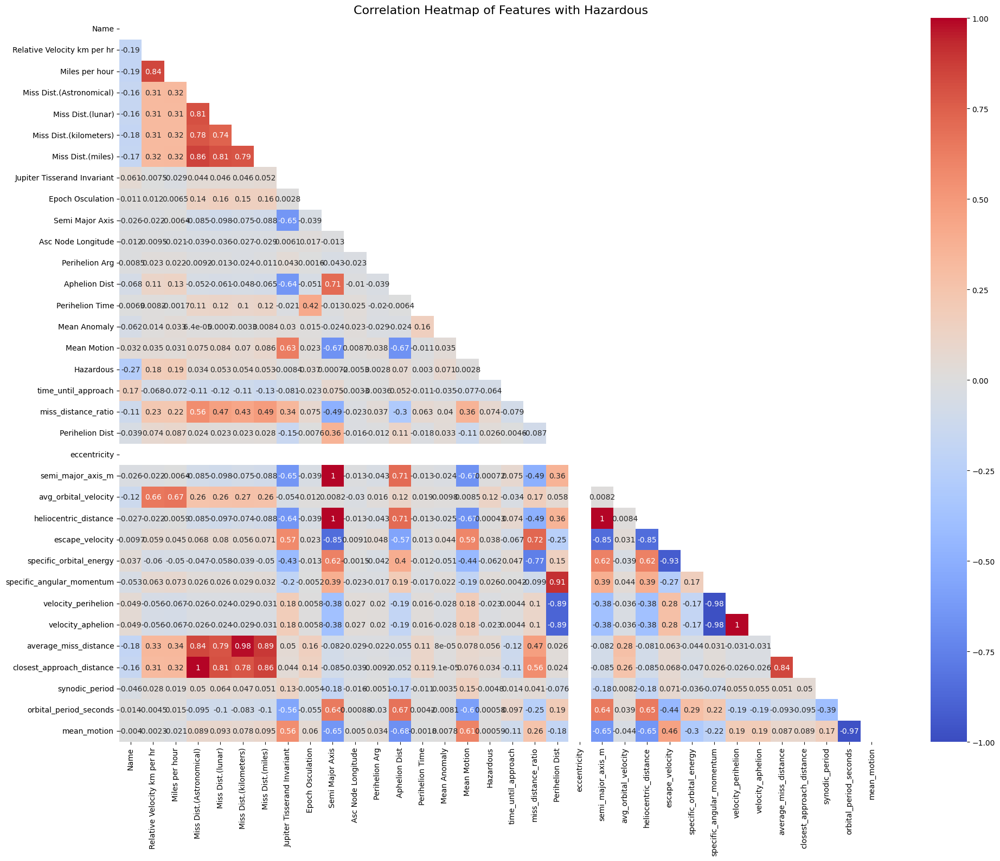

In [49]:
df['Hazardous'] = df['Hazardous'].astype(int)


numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns


correlation_matrix = df[numeric_columns].corr()


mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))


plt.figure(figsize=(20, 16))


sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)

plt.title('Correlation Heatmap of Features with Hazardous', fontsize=16)


plt.tight_layout()
plt.show()

In [50]:
categorical_features=df.select_dtypes(include='category')

In [51]:
print(categorical_features.columns)

Index(['Relative Velocity km per sec', 'Orbital Period', 'Orbit Uncertainity',
       'Relative Velocity km per sec_ordinal', 'Orbital Period_ordinal',
       'Orbit Uncertainity_ordinal'],
      dtype='object')


In [52]:
columns_to_drop = [
    'Relative Velocity km per sec',
    'Orbital Period',
    'Orbit Uncertainity',
    'Relative Velocity km per sec_ordinal',
    'Orbital Period_ordinal',
    'Orbit Uncertainity_ordinal'
]

df.drop(columns=columns_to_drop, axis=1, inplace=True)

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534 entries, 0 to 4533
Data columns (total 46 columns):
 #   Column                                  Non-Null Count  Dtype         
---  ------                                  --------------  -----         
 0   Name                                    4534 non-null   float64       
 1   Epoch Date Close Approach               4534 non-null   datetime64[ns]
 2   Relative Velocity km per hr             4534 non-null   float64       
 3   Miles per hour                          4534 non-null   float64       
 4   Miss Dist.(Astronomical)                4534 non-null   float64       
 5   Miss Dist.(lunar)                       4534 non-null   float64       
 6   Miss Dist.(kilometers)                  4534 non-null   float64       
 7   Miss Dist.(miles)                       4534 non-null   float64       
 8   Jupiter Tisserand Invariant             4534 non-null   float64       
 9   Epoch Osculation                        4534 non-nul

# 4. Hazardous Classification (35 points)
In this section, we will build a classifier to identify whether an asteroid is hazardous or not, implement K-Fold Cross Validation, optimize hyperparameters, and evaluate the model using various metrics.


## 4.1 Build a robust and efficient classifier to classify asteroids as Hazardous (1) or Not Hazardous (0). (7 MARKS)


In [54]:
from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import ADASYN
from sklearn.metrics import roc_curve, auc, confusion_matrix
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import RandomizedSearchCV
import shap

c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [55]:
X = df.drop(['Hazardous', 'Name', 'approach_date'], axis=1)
y = df['Hazardous']

In [56]:
X['Epoch Date Close Approach'] = pd.to_datetime(X['Epoch Date Close Approach']).astype(int) / 10**9

In [57]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4534 entries, 0 to 4533
Data columns (total 43 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   Epoch Date Close Approach               4534 non-null   float64
 1   Relative Velocity km per hr             4534 non-null   float64
 2   Miles per hour                          4534 non-null   float64
 3   Miss Dist.(Astronomical)                4534 non-null   float64
 4   Miss Dist.(lunar)                       4534 non-null   float64
 5   Miss Dist.(kilometers)                  4534 non-null   float64
 6   Miss Dist.(miles)                       4534 non-null   float64
 7   Jupiter Tisserand Invariant             4534 non-null   float64
 8   Epoch Osculation                        4534 non-null   float64
 9   Semi Major Axis                         4534 non-null   float64
 10  Asc Node Longitude                      4534 non-null   floa

In [58]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [59]:

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [60]:
# Apply ADASYN for handling class imbalance
adasyn = ADASYN(random_state=42)
X_train_resampled, y_train_resampled = adasyn.fit_resample(X_train_scaled, y_train)

In [61]:
xgb = XGBClassifier(random_state=42, use_label_encoder=True, eval_metric='logloss')

In [62]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import log_loss, accuracy_score
from sklearn.metrics import roc_curve, auc, confusion_matrix, classification_report

## 4.2 Implement K-Fold Cross Validation for training. Train the dataset for all values of K from 2 to 10. Plot the loss and accuracy versus epochs for these K values. (12 MARKS)


In [63]:
def perform_cv(model, X, y, k_range):
    cv_results = {'loss': [], 'accuracy': []}

    for k in k_range:
        tscv = TimeSeriesSplit(n_splits=k)
        fold_loss = []
        fold_accuracy = []

        for train_index, val_index in tscv.split(X):
            X_fold_train, X_fold_val = X[train_index], X[val_index]
            y_fold_train, y_fold_val = y[train_index], y[val_index]

            model.fit(X_fold_train, y_fold_train)
            y_pred_proba = model.predict_proba(X_fold_val)[:, 1]  
            y_pred = model.predict(X_fold_val)

            
            if len(np.unique(y_fold_val)) == 2:  
                
                fold_loss.append(log_loss(y_fold_val, y_pred_proba))
                
                fold_accuracy.append(accuracy_score(y_fold_val, y_pred))
            else:
                
                print(f"Skipping fold with only one class in y_fold_val: {np.unique(y_fold_val)}")
                continue  
        
        if fold_loss:
            cv_results['loss'].append(np.mean(fold_loss))
        if fold_accuracy:
            cv_results['accuracy'].append(np.mean(fold_accuracy))

    return cv_results

In [ ]:
# Perform cross-validation
xgb_result = perform_cv(xgb, X_train_resampled, y_train_resampled, range(2, 11))

In [65]:
# Plot CV results
def plot_cv_results(cv_results, model_name):
    k_values = range(2, 11)
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(k_values, cv_results['loss'])
    plt.title(f'{model_name} - Loss vs K')
    plt.xlabel('K')
    plt.ylabel('Loss')

    plt.subplot(1, 2, 2)
    plt.plot(k_values, cv_results['accuracy'])
    plt.title(f'{model_name} - Accuracy vs K')
    plt.xlabel('K')
    plt.ylabel('Accuracy')

    plt.tight_layout()
    plt.show()

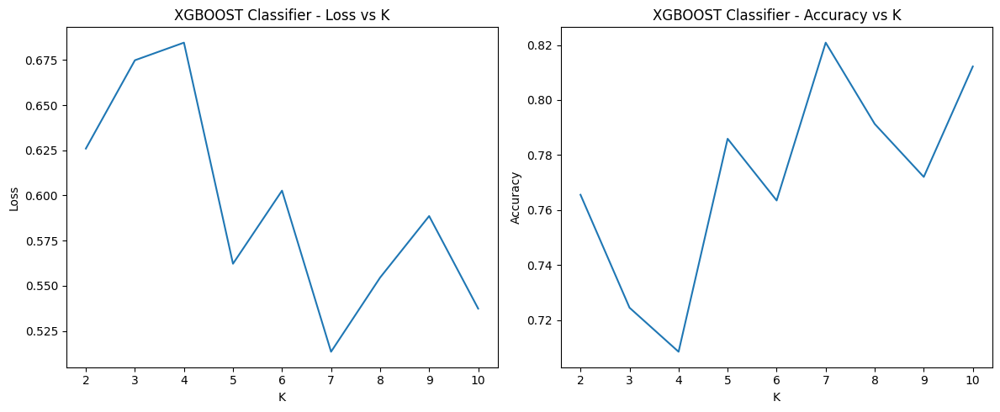

In [66]:
plot_cv_results(xgb_result, 'XGBOOST Classifier')

## 4.3 Optimize all the hyperparameters used in the classifier by selecting an appropriate optimization method. (8 MARKS)


In [67]:
# Step 3: Hyperparameter Optimization
param_grid = {
    'max_depth': [3, 5, 7, 9],
    'learning_rate': [0.01, 0.1, 0.3],
    'n_estimators': [100, 200, 300],
    'min_child_weight': [1, 3, 5],
    'gamma': [0, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'scale_pos_weight': [1, 3, 5]
}

In [71]:
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_grid,
    n_iter=50,
    cv=5,
    verbose=2,
    random_state=42,
    n_jobs=1
)

In [72]:
random_search.fit(X_train_resampled, y_train_resampled)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.4s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=3, subsample=1.0; total time=   0.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=3, subsample=1.0; total time=   0.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=3, subsample=1.0; total time=   0.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=3, subsample=1.0; total time=   1.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=3, subsample=1.0; total time=   1.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=200, scale_pos_weight=5, subsample=1.0; total time=   1.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=200, scale_pos_weight=5, subsample=1.0; total time=   1.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=200, scale_pos_weight=5, subsample=1.0; total time=   1.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=200, scale_pos_weight=5, subsample=1.0; total time=   0.9s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=200, scale_pos_weight=5, subsample=1.0; total time=   0.8s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:55:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   2.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   2.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   1.9s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   3.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   0.9s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=200, scale_pos_weight=5, subsample=0.8; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:17] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=200, scale_pos_weight=5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=200, scale_pos_weight=5, subsample=0.8; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=200, scale_pos_weight=5, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=200, scale_pos_weight=5, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.6; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.6; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.6; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.6; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.6; total time=   0.3s
[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=5, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=100, scale_pos_weight=3, subsample=0.6; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=100, scale_pos_weight=3, subsample=0.6; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=100, scale_pos_weight=3, subsample=0.6; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=100, scale_pos_weight=3, subsample=0.6; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=1, n_estimators=100, scale_pos_weight=3, subsample=0.6; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=1.0; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=1.0; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=1.0; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=1.0; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=1.0; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=9, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.6; total time=   1.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=9, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.6; total time=   1.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=9, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.6; total time=   1.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=9, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.6; total time=   1.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=9, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.6; total time=   1.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=3, subsample=1.0; total time=   0.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=3, subsample=1.0; total time=   0.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=3, subsample=1.0; total time=   0.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:42] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=3, subsample=1.0; total time=   0.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=3, subsample=1.0; total time=   0.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=5, min_child_weight=5, n_estimators=200, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:46] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=0.6; total time=   0.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=0.6; total time=   0.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=0.6; total time=   0.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=0.6; total time=   0.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=0.6; total time=   0.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=1.0; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=1.0; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=1.0; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=1.0; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.3, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=1.0; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.1, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=5, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=5, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=5, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:56:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=5, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=5, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=0.6; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=0.6; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=0.6; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=0.6; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=3, n_estimators=100, scale_pos_weight=1, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=5, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=100, scale_pos_weight=5, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=100, scale_pos_weight=5, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=100, scale_pos_weight=5, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=100, scale_pos_weight=5, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=5, min_child_weight=1, n_estimators=100, scale_pos_weight=5, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=1.0; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=1.0; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=1.0; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=1.0; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=1.0; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.3, max_depth=9, min_child_weight=3, n_estimators=200, scale_pos_weight=1, subsample=0.6; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.3, max_depth=9, min_child_weight=3, n_estimators=200, scale_pos_weight=1, subsample=0.6; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:05] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.3, max_depth=9, min_child_weight=3, n_estimators=200, scale_pos_weight=1, subsample=0.6; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.3, max_depth=9, min_child_weight=3, n_estimators=200, scale_pos_weight=1, subsample=0.6; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.3, max_depth=9, min_child_weight=3, n_estimators=200, scale_pos_weight=1, subsample=0.6; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=9, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=0.6; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:07] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=9, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=0.6; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=9, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=0.6; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=9, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=0.6; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:09] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=9, min_child_weight=3, n_estimators=200, scale_pos_weight=3, subsample=0.6; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.01, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   1.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:11] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.01, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   1.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:13] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.01, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   1.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.01, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   1.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.01, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   1.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=200, scale_pos_weight=5, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:18] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=200, scale_pos_weight=5, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=200, scale_pos_weight=5, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:19] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=200, scale_pos_weight=5, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_depth=7, min_child_weight=5, n_estimators=200, scale_pos_weight=5, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:20] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=9, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=9, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:22] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=9, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=9, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_depth=9, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.7s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, scale_pos_weight=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, scale_pos_weight=1, subsample=1.0; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:24] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, scale_pos_weight=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, scale_pos_weight=1, subsample=1.0; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=1, n_estimators=100, scale_pos_weight=1, subsample=1.0; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.5s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=7, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.5s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=200, scale_pos_weight=1, subsample=0.6; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=200, scale_pos_weight=1, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=200, scale_pos_weight=1, subsample=0.6; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=200, scale_pos_weight=1, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=200, scale_pos_weight=1, subsample=0.6; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:28] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=3, min_child_weight=5, n_estimators=100, scale_pos_weight=5, subsample=0.8; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.1s
[CV] END colsample_bytree=0.6, gamma=0.2, learning_rate=0.3, max_depth=3, min_child_weight=1, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=3, subsample=0.6; total time=   0.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:31] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=3, subsample=0.6; total time=   0.9s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=3, subsample=0.6; total time=   1.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:33] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=3, subsample=0.6; total time=   1.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=3, subsample=0.6; total time=   1.1s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:35] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0, learning_rate=0.1, max_depth=3, min_child_weight=5, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   0.2s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=9, min_child_weight=5, n_estimators=100, scale_pos_weight=3, subsample=1.0; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=9, min_child_weight=5, n_estimators=100, scale_pos_weight=3, subsample=1.0; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=9, min_child_weight=5, n_estimators=100, scale_pos_weight=3, subsample=1.0; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:38] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=9, min_child_weight=5, n_estimators=100, scale_pos_weight=3, subsample=1.0; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.2, learning_rate=0.1, max_depth=9, min_child_weight=5, n_estimators=100, scale_pos_weight=3, subsample=1.0; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   1.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   1.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   1.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   1.9s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:47] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.01, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=5, subsample=0.8; total time=   1.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0, learning_rate=0.3, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.3s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.6; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:51] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.6; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.6; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.6; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.2, learning_rate=0.1, max_depth=5, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.6; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.6s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:56] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0, learning_rate=0.01, max_depth=7, min_child_weight=5, n_estimators=300, scale_pos_weight=1, subsample=1.0; total time=   0.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.7s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:57] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.9s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:58] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:57:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.8s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:00] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.6, gamma=0.1, learning_rate=0.1, max_depth=9, min_child_weight=3, n_estimators=300, scale_pos_weight=1, subsample=0.8; total time=   0.7s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=100, scale_pos_weight=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=100, scale_pos_weight=1, subsample=0.8; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=100, scale_pos_weight=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=100, scale_pos_weight=1, subsample=0.8; total time=   0.0s
[CV] END colsample_bytree=0.8, gamma=0.1, learning_rate=0.01, max_depth=3, min_child_weight=5, n_estimators=100, scale_pos_weight=1, subsample=0.8; total time=   0.0s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:01] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=5, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=5, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:02] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=5, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=5, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.3, max_depth=5, min_child_weight=1, n_estimators=300, scale_pos_weight=3, subsample=0.8; total time=   0.4s


c:\Users\oms04\Desktop\IIT KGP\venv\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:58:04] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning...
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=42, ...),
                   n_iter=50, n_jobs=1,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0, 0.1, 0.2],
                                        'learning_rate': [0.01, 0.1, 0.3],
                                        'max_depth': [3, 5, 7, 9],
                                        'min_child_weight': [1, 3, 5],
                                        'n_estimators': [100, 200, 300],
                                        'scale_pos_weight': [1, 3, 5],
                                        'subsample': [0.6, 0.8, 1.0]},
                   random_state=42, verbose=2)

In [73]:

print("Best parameters:", random_search.best_params_)
print("Best cross-validation score:", random_search.best_score_)

Best parameters: {'subsample': 0.6, 'scale_pos_weight': 3, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 9, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 1.0}
Best cross-validation score: 0.8909686570349077


In [74]:
best_model = random_search.best_estimator_

In [75]:

y_pred = best_model.predict(X_test_scaled)
y_pred_proba = best_model.predict_proba(X_test_scaled)[:, 1]

In [76]:

print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.86      0.86       760
           1       0.32      0.35      0.33       147

    accuracy                           0.77       907
   macro avg       0.59      0.60      0.60       907
weighted avg       0.78      0.77      0.78       907



## 4.4 Plot the ROC curve and Confusion Matrix to quantify the performance of your classifier. (4 MARKS)


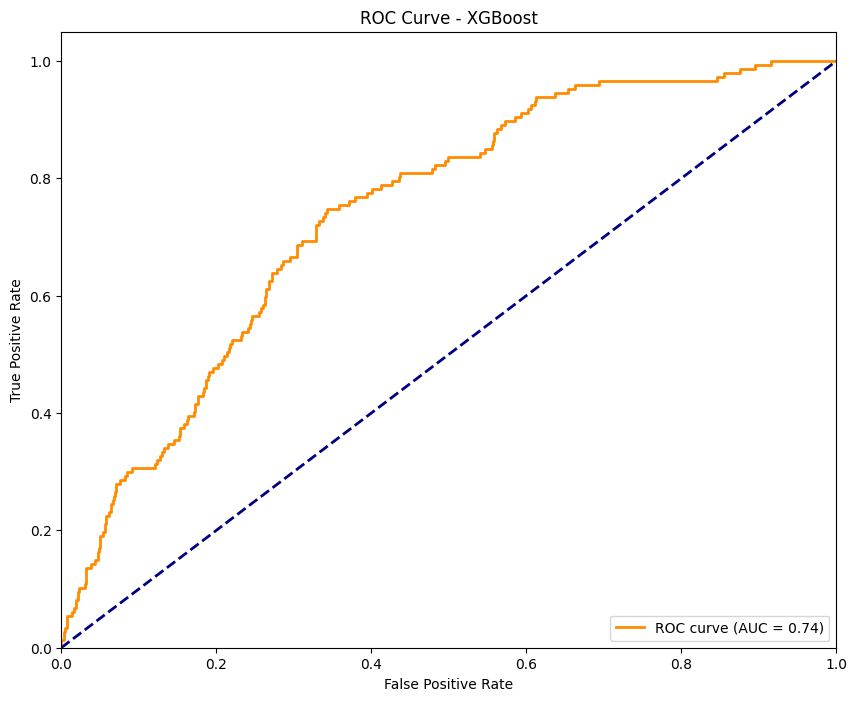

In [77]:

fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBoost')
plt.legend(loc="lower right")
plt.show()

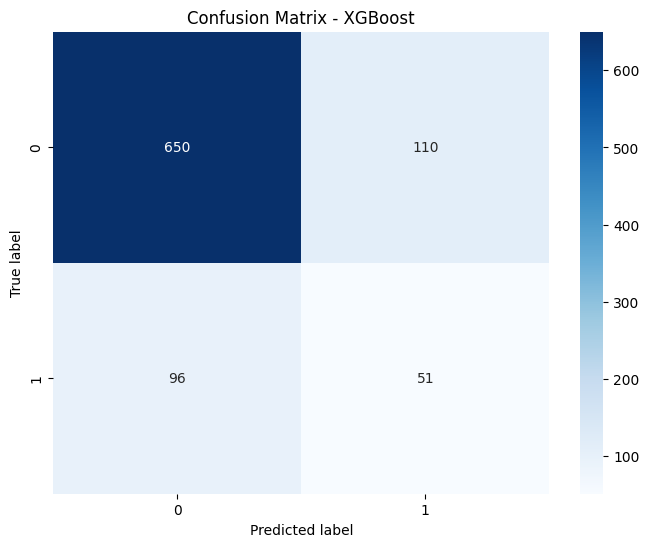

In [78]:

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - XGBoost')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


## 4.5 Use SHAP Values, Permutation Importance, or Partial Dependence Plots to list the most and least useful features. (4 MARKS)


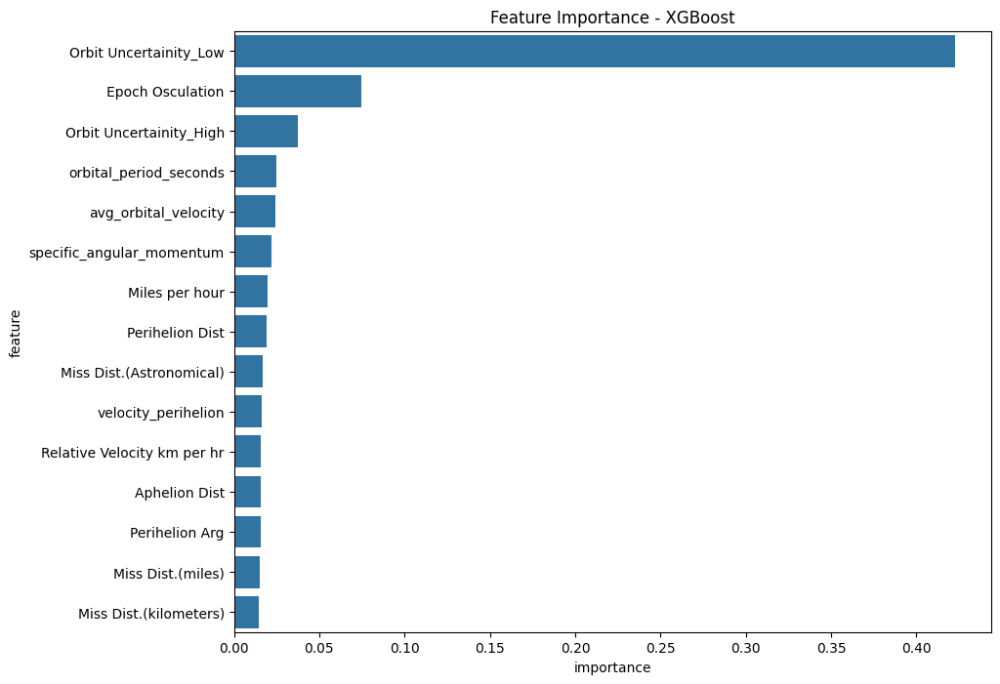

In [79]:

feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': best_model.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='importance', y='feature', data=feature_importance.head(15))
plt.title("Feature Importance - XGBoost")
plt.show()

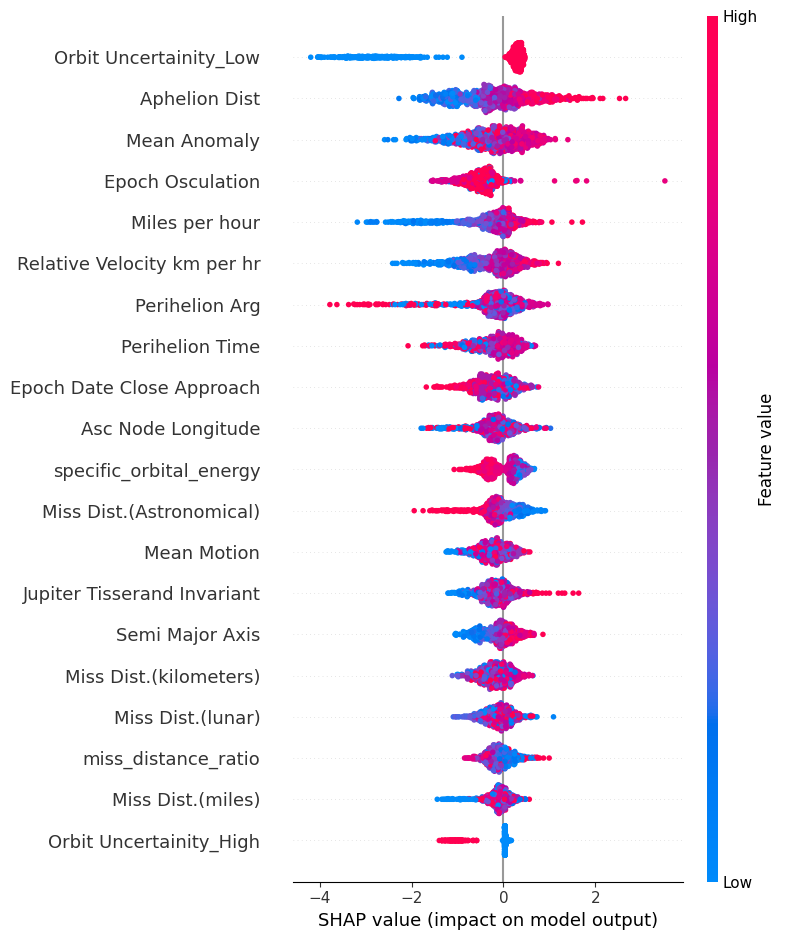

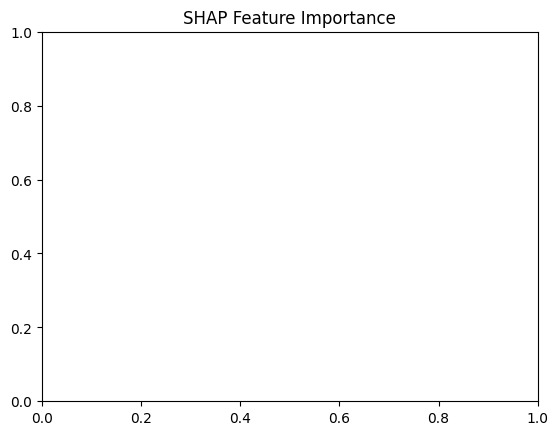

In [82]:
# SHAP values for feature importance interpretation
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test_scaled)

plt.figure(figsize=(10, 8))
shap.summary_plot(shap_values, X_test_scaled, feature_names=X.columns)
plt.title("SHAP Feature Importance")
plt.show()

In [83]:
# Print most and least important features
print("\nMost important features:", ', '.join(feature_importance['feature'].head().tolist()))
print("Least important features:", ', '.join(feature_importance['feature'].tail().tolist()))


Most important features: Orbit Uncertainity_Low, Epoch Osculation, Orbit Uncertainity_High, orbital_period_seconds, avg_orbital_velocity
Least important features: velocity_aphelion, mean_motion, Orbital Period_High, Relative Velocity km per sec_Very Fast, Relative Velocity km per sec_Very Slow
